In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Task 1. CycleGAN

### Student: Sandra M Nino A

For the CycleGAN task, the code was taken from https://www.tensorflow.org/tutorials/generative/cyclegan. This CycleGAN implementation demonstrates how image to image translation from two different domains is possible without having any paired training examples.

The example of the original code trained a CycleGAN to translate from images of horses to images of zebras. Therefore, we had mainly to construct our dataset with the same structure of horses and zebras to being able to reproduce the original pipeline in our task of translating from images of humans to images of cats and dogs.

### Libraries

We have to install the tensorflow examples to being able to use the generators and discriminators need it to do the translation from one domain to another domain.

In [ ]:
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-rpj33u7e
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/examples.git /tmp/pip-req-build-rpj33u7e
  Resolved https://github.com/tensorflow/examples.git to commit fff4bcda7201645a1efaea4534403daf5fc03d42
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-examples: filename=tensorflow_examples-0.1703207612.1461250479831370929614362828255168868146460245314-py3-none-any.whl size=301582 sha256=5501bab136a18a17b22ccc335580a8044546f8b98cf57778b76cf54f0fea1faa
  Stored in directory: /tmp/pip-ephem-wheel-cache-g3q82wox/wheels/72/5f/d0/7fe769eaa229bf20101d11a357eb23c83c481bee2d7f710599
Successfully built tensorflow-examples


In [ ]:
import tensorflow as tf
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

AUTOTUNE = tf.data.AUTOTUNE

# Construction of datasets

The following cells SHOULD NOT be runned. This is just to demonstrate how the training dataset was created in order to achieve the outputs of our image translation from humans to cats and dogs.

We had extensive data which did not have the same structure as the original pipeline. Thus, I created one training images folder and one test images folder for each domain. For each training folder, I randomly selected 3000 images of humans and 3000 images of cats and dogs.

For the creation of the training humans folder, I randomly selected 1500 images from the celebrities folder and 1500 images from the humans with different ages including babies.

For the creation of the training of cats and dogs folder, I took all available images of dogs, which they were 900 images, and the rest were randomly selected from the cats folder, that means that there are 2100 images of cats.

In [ ]:
import os
import random
import shutil

def copy_random_images(source_folder, destination_folder, num_images):
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)

    files = os.listdir(source_folder)

    random_images = random.sample(files, num_images)

    for image in random_images:
        source_path = os.path.join(source_folder, image)
        destination_path = os.path.join(destination_folder, image)
        shutil.copyfile(source_path, destination_path)

In [ ]:
# HUMANS - 3000
home = os.path.expanduser("~")  # Get the home directory
source_folder = os.path.join(home, "Downloads", "cycleGAN_faces/utkcropped")
destination_folder = "./CYCLEGAN/human_faces/images"
num_images = 1500
copy_random_images(source_folder, destination_folder, num_images)

source_folder = os.path.join(home, "Downloads", "cycleGAN_faces/img_align_celeba")
destination_folder = "./CYCLEGAN/human_faces/images"
num_images = 1500 #
copy_random_images(source_folder, destination_folder, num_images)

In [ ]:
# CATS 2100- DOGS 900
source_folder = os.path.join(home, "Downloads", "cats")
destination_folder = "./CYCLEGAN/cats_dogs/images"
num_images = 2100
copy_random_images(source_folder, destination_folder, num_images)

source_folder = os.path.join(home, "Downloads", "CatsAndDogs/Train/Dog")
destination_folder = "./CYCLEGAN/cats_dogs/images"
num_images = 500
copy_random_images(source_folder, destination_folder, num_images)

source_folder = os.path.join(home, "Downloads", "CatsAndDogs/Validate/Dog")
destination_folder = "./CYCLEGAN/cats_dogs/images"
num_images = 200
copy_random_images(source_folder, destination_folder, num_images)

source_folder = os.path.join(home, "Downloads", "CatsAndDogs/Test/Dog")
destination_folder = "./CYCLEGAN/cats_dogs/images"
num_images = 200
copy_random_images(source_folder, destination_folder, num_images)

## Data Preprocessing

If the data folders mentioned above are not available, do not run the cells onwards. If they are available, update the path to the correct location. This points to my drive folder structure.

As mentioned previously, we have 3000 images of humans and 3000 images of cats and dogs.

In [ ]:
train_humans_path = '/content/drive/MyDrive/Datasets_DL/CYCLEGAN/human_faces/'
test_humans_path = '/content/drive/MyDrive/Datasets_DL/CYCLEGAN/human_faces_test/'
train_animals_path = '/content/drive/MyDrive/Datasets_DL/CYCLEGAN/cats_dogs/'
test_animals_path = '/content/drive/MyDrive/Datasets_DL/CYCLEGAN/cats_dogs_test/'

batch_size = 1
img_height = 200
img_width = 200

train_humans = tf.keras.preprocessing.image_dataset_from_directory(
  train_humans_path,
  image_size=(img_height, img_width),
  batch_size=batch_size)

train_animals = tf.keras.preprocessing.image_dataset_from_directory(
  train_animals_path,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3000 files belonging to 1 classes.
Found 3000 files belonging to 1 classes.


In [ ]:
test_humans = tf.keras.preprocessing.image_dataset_from_directory(
  test_humans_path,
  image_size=(img_height, img_width),
  batch_size=batch_size)

test_animals = tf.keras.preprocessing.image_dataset_from_directory(
  test_animals_path,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 15 files belonging to 1 classes.
Found 15 files belonging to 1 classes.



Then, for training images we apply random jittering, which means resizing the images to 286x286 and then crop it to 256x256, random mirroring, which means that randomly flips the image horizontally, and normalisation.

For test images, we just resize the image to 256x256 and normalisation.

In [ ]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def random_crop(image):
    cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image


In [ ]:
def normalize(image):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

In [ ]:
def random_jitter(image):
    image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    image = random_crop(image)

    image = tf.image.random_flip_left_right(image)

    return image

In [ ]:
def preprocess_image_train(image, label):
    image = tf.squeeze(image, axis=0)
    image = random_jitter(image)
    image = normalize(image)
    return image

In [ ]:
def preprocess_image_test(image, label):
    image = tf.squeeze(image, axis=0)
    image = tf.image.resize(image, [IMG_WIDTH, IMG_HEIGHT],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    image = normalize(image)
    return image

In [ ]:
train_humans = train_humans.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

train_animals = train_animals.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
test_humans = test_humans.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_animals = test_animals.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

As demonstration of the following steps, we pick a human sample and an animal sample.

In [ ]:
sample_human = next(iter(train_humans))
sample_animal = next(iter(train_animals))

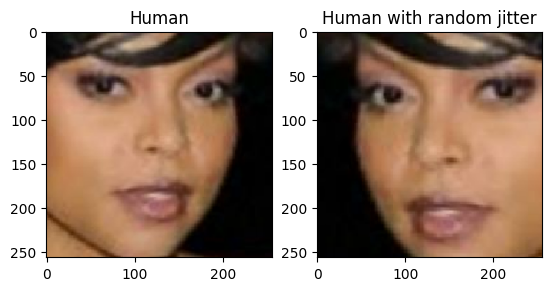

In [ ]:
plt.subplot(121)
plt.title('Human')
plt.imshow(sample_human[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Human with random jitter')
plt.imshow(random_jitter(sample_human[0]) * 0.5 + 0.5)

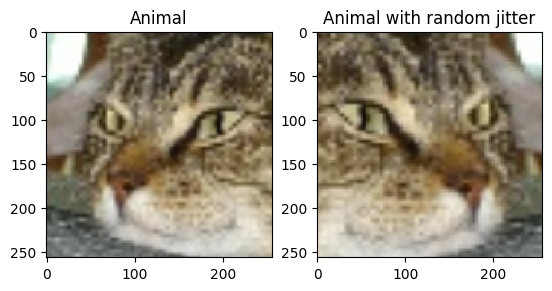

In [ ]:
plt.subplot(121)
plt.title('Animal')
plt.imshow(sample_animal[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Animal with random jitter')
plt.imshow(random_jitter(sample_animal[0]) * 0.5 + 0.5)

## Creation of generators and discriminators

To achieve the translation of images from one domain to another domain, we need:

![Cyclegan model](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cyclegan_model.png?raw=1)

1. Generator `g` that learns to transform image `X` to image `Y`. In our case, learns to transform human images to cats/dogs images.
2. Generator `f` that learns to transform image `Y` to image `X`. In our case, learns to transform cats/dogs images to humans images.
3. Discriminator `D_X` that learns to differentiate between image `X` and generated image `X` (`F(Y)`). In our case, learns to differentiate if the image is a real human.  
4. Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`). In our case, learns to differentiate if the image is a real cat/dog.

In [ ]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

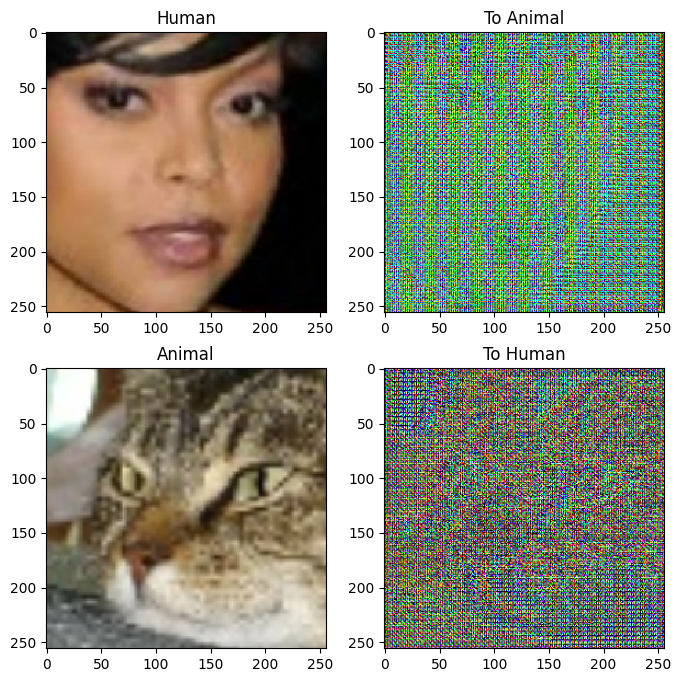

In [ ]:
to_animal = generator_g(sample_human)
to_human = generator_f(sample_animal)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_human, to_animal, sample_animal, to_human]
title = ['Human', 'To Animal', 'Animal', 'To Human']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

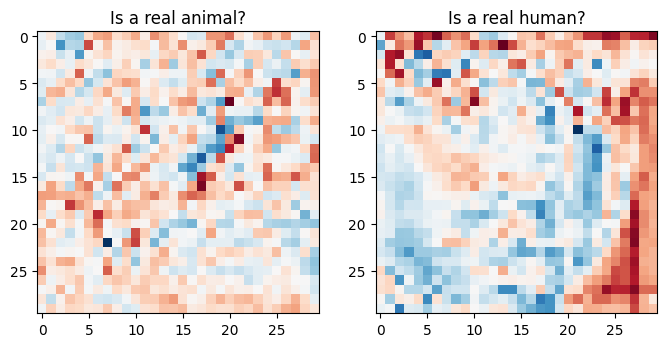

In [ ]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real animal?')
plt.imshow(discriminator_y(sample_animal)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real human?')
plt.imshow(discriminator_x(sample_human)[0, ..., -1], cmap='RdBu_r')

plt.show()

## Creation of Loss functions

In CycleGAN, to enforce the correct mapping between both domains, we need losses for the discriminators and generators.

In [ ]:
LAMBDA = 10

In [ ]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [ ]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

In [ ]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

  return LAMBDA * loss1

In [ ]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

## Optimisers

Initialize the optimizers for all the generators and the discriminators. In this case, we choose Adam.

In [ ]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Checkpoints

Please, update the path with the location of the folder provided with the Checkpoints folder. The folder is called `checkpoints/cyclegan`.

Then run this cell to upload the latest checkpoint. In our training, the latest checkpoint that should be loaded is `checkpoints/cyclegan/ckpt-20`. You don't have to do anything, just run the cell.

In [ ]:
checkpoint_path = "/content/drive/MyDrive/Checkpoints_DL/checkpoints/cyclegan"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


## Training

I trained for 100 epochs which is less than the initial suggestion of 200 epochs. Therefore, the generated images will not be that good.

In [ ]:
EPOCHS = 100

In [ ]:
def generate_images(model, test_input):
  prediction = model(test_input)
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [ ]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.

    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss,
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss,
                                        generator_f.trainable_variables)

  discriminator_x_gradients = tape.gradient(disc_x_loss,
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss,
                                            discriminator_y.trainable_variables)

  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                            generator_f.trainable_variables))

  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

The following cell is specific for training the images.

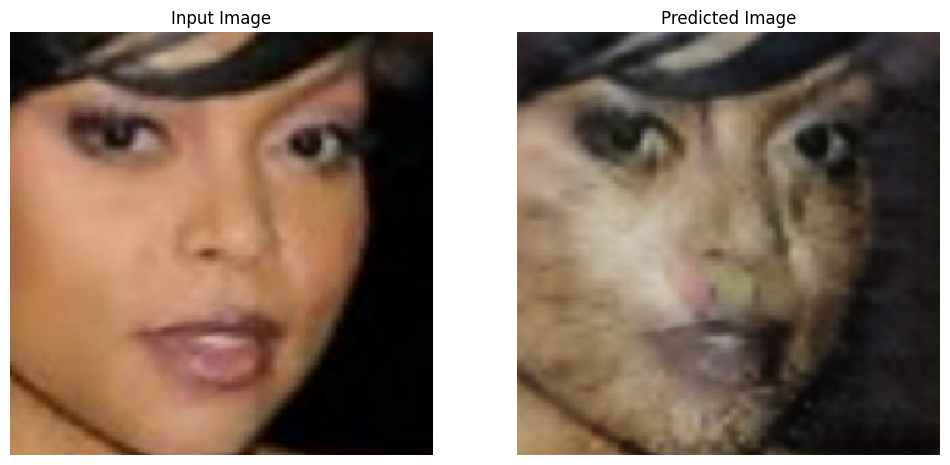

Saving checkpoint for epoch 100 at /content/drive/MyDrive/Checkpoints_DL/checkpoints/cyclegan/ckpt-20
Time taken for epoch 100 is 65.10959458351135 sec



In [ ]:
for epoch in range(EPOCHS):
  start = time.time()

  n = 0
  for image_x, image_y in tf.data.Dataset.zip((train_humans, train_animals)):
    train_step(image_x, image_y)
    if n % 10 == 0:
      print ('.', end='')
    n += 1

  clear_output(wait=True)
  generate_images(generator_g, sample_human)

  if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

## CycleGAN test

After loading our checkpoints, we can generate images from humans to cats and dogs. As well, as images from cats/dogs to humans.

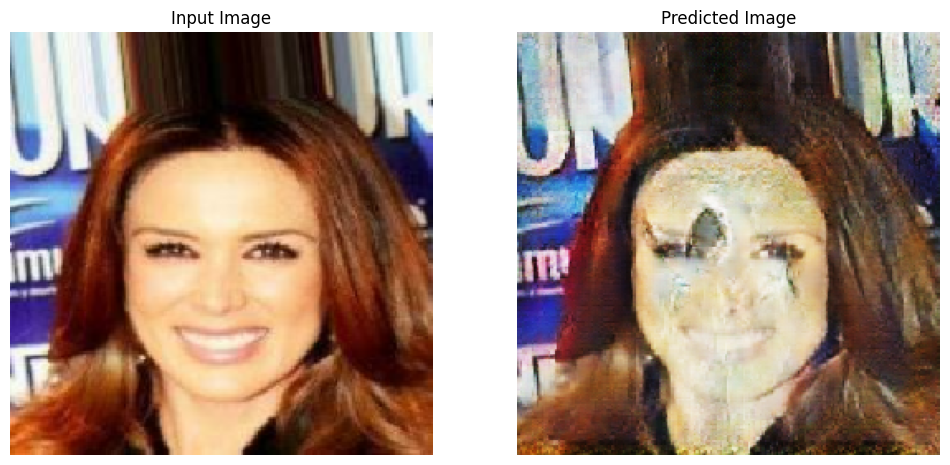

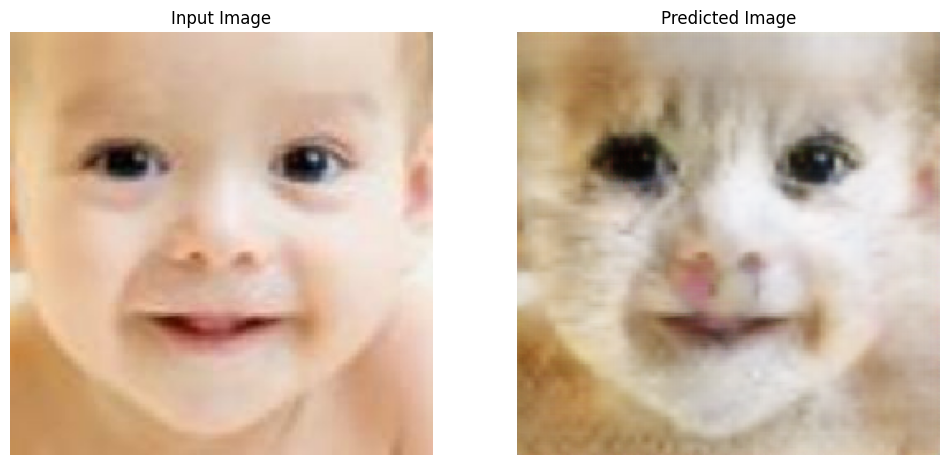

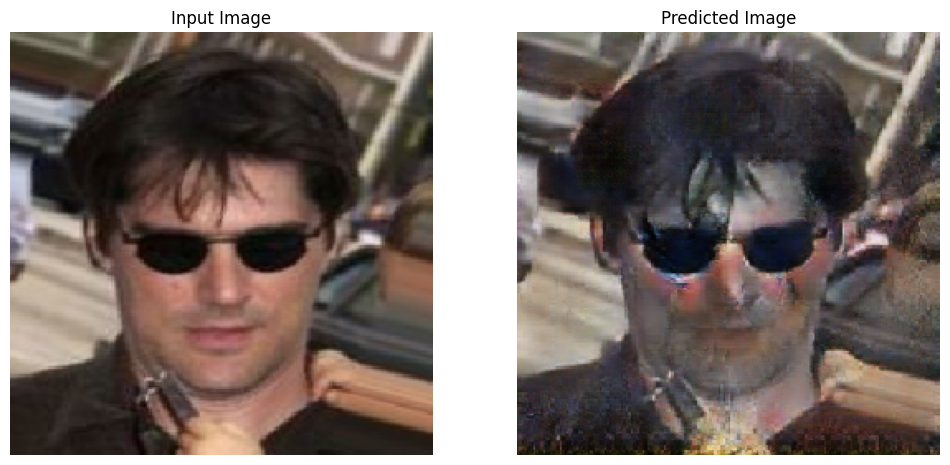

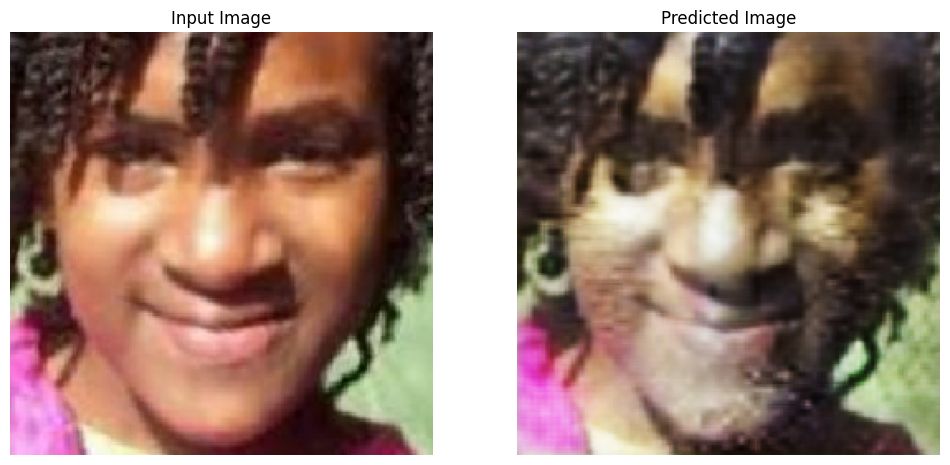

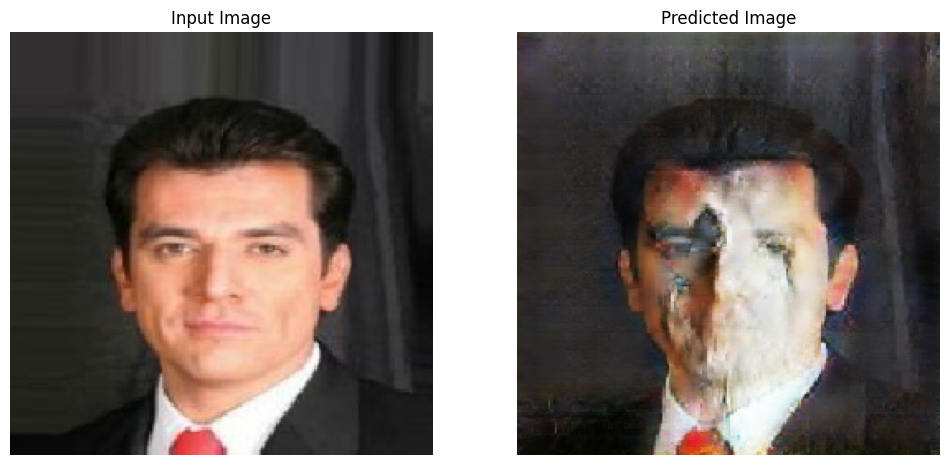

...

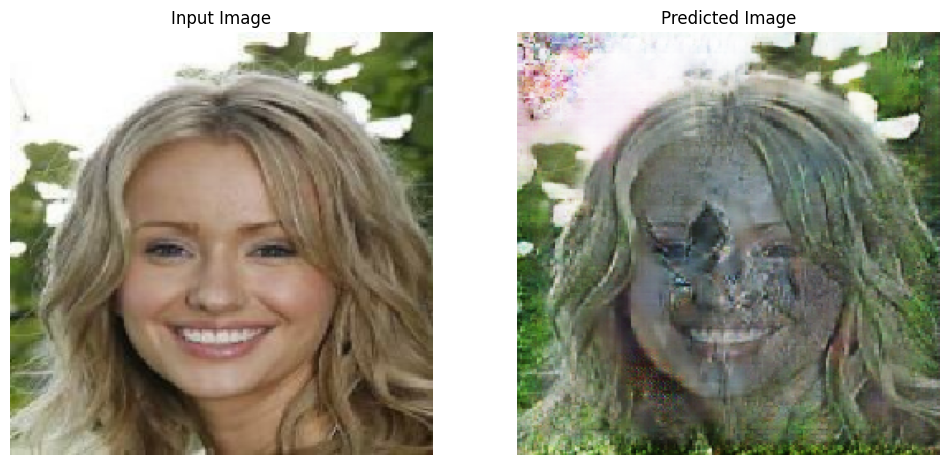

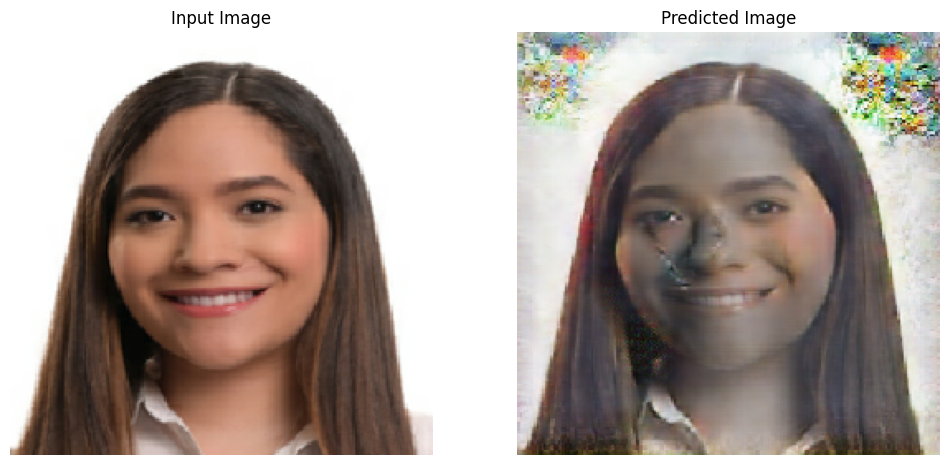

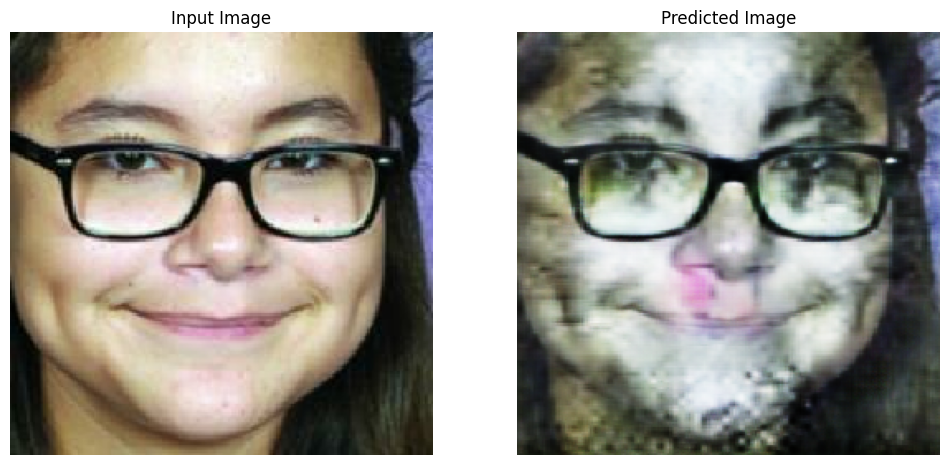

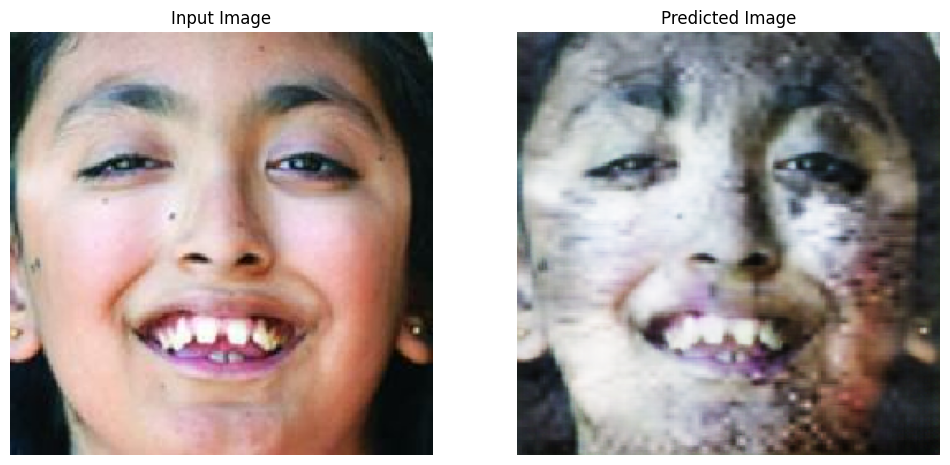

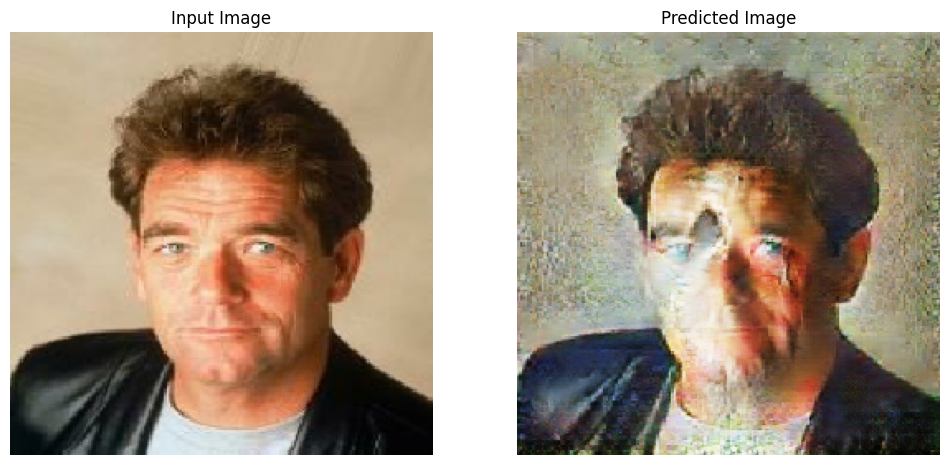

In [ ]:
for inp in test_humans.take(15):
    generate_images(generator_g, inp)

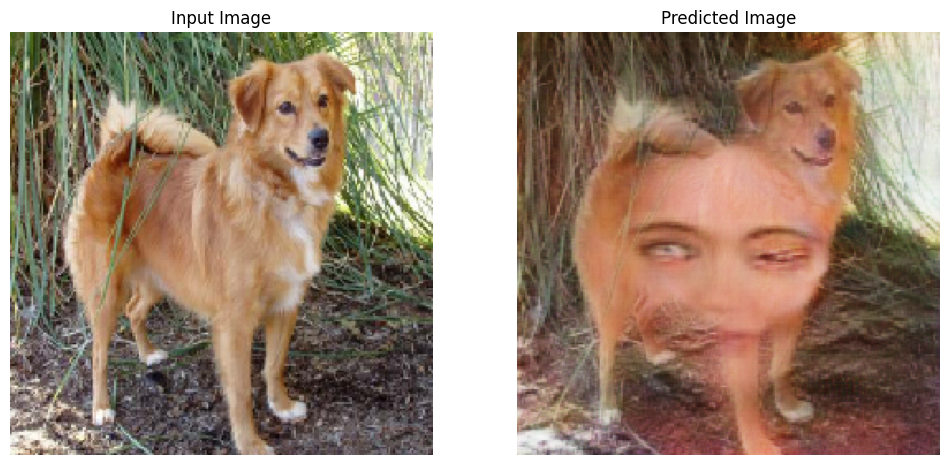

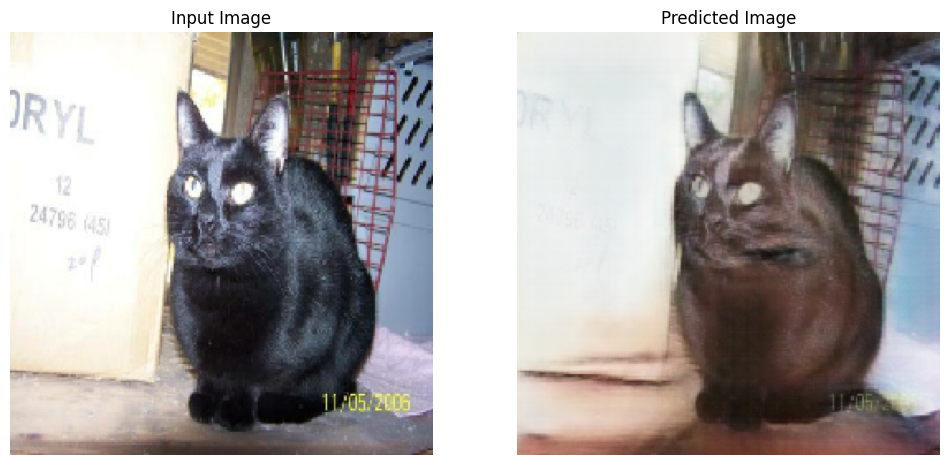

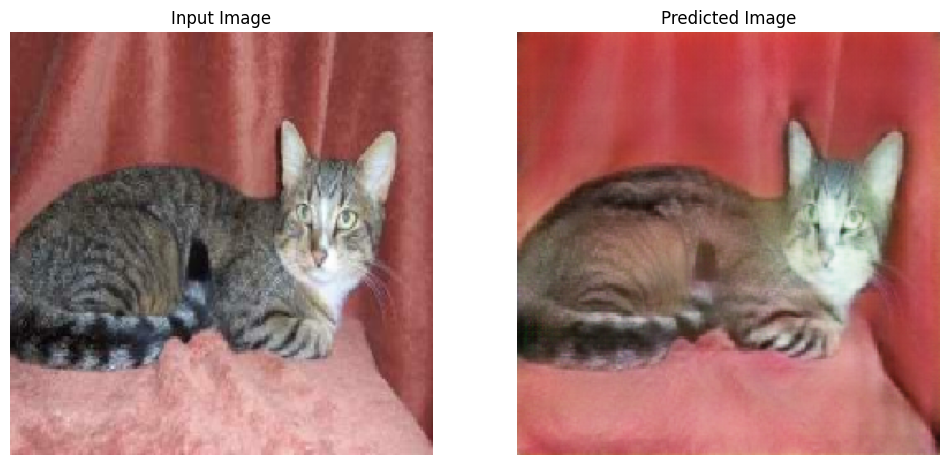

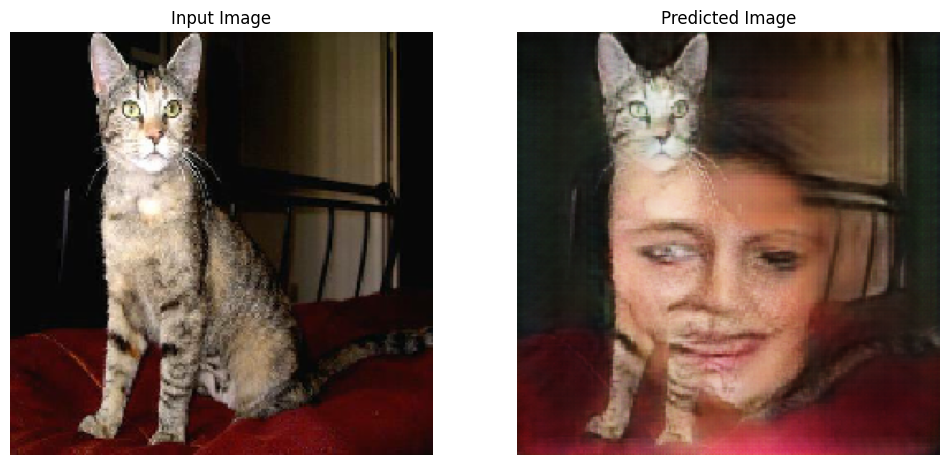

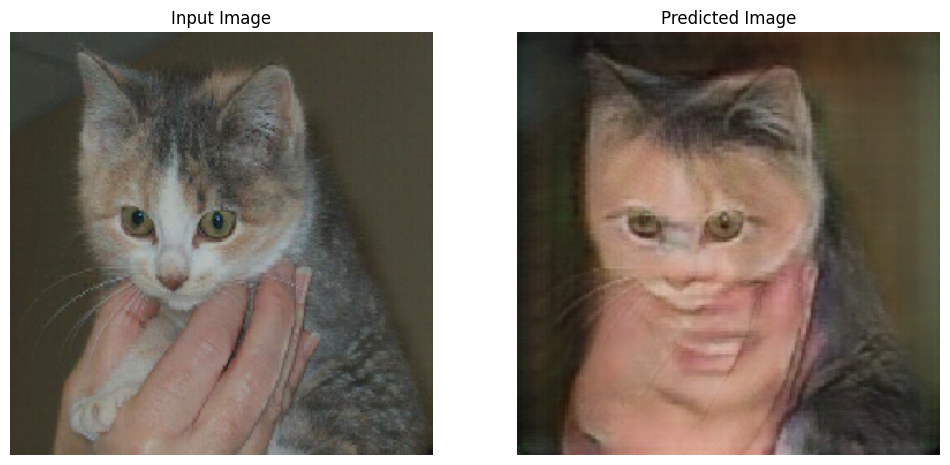

...

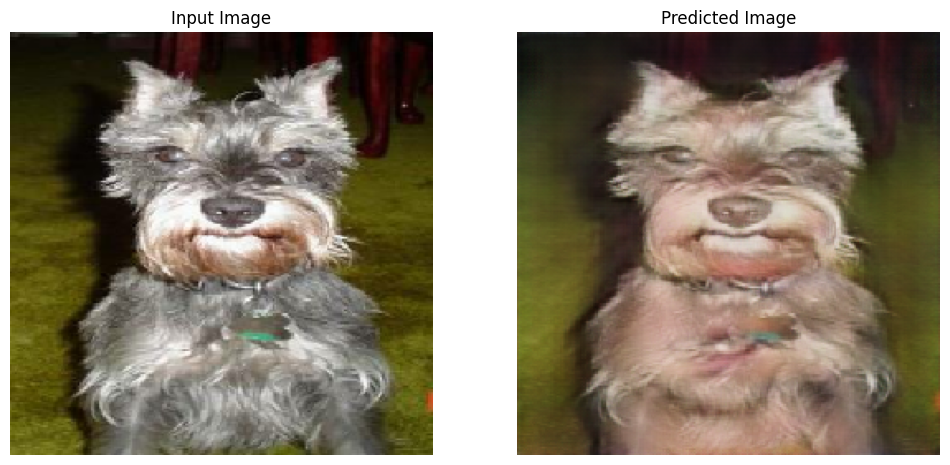

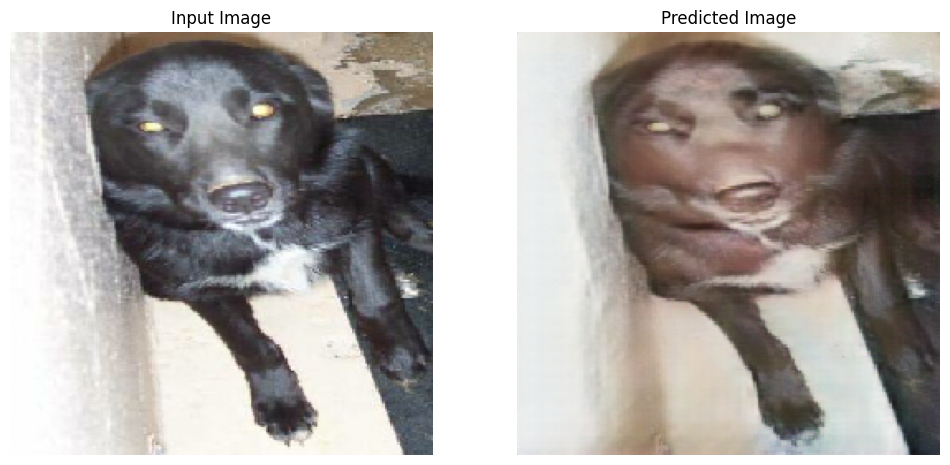

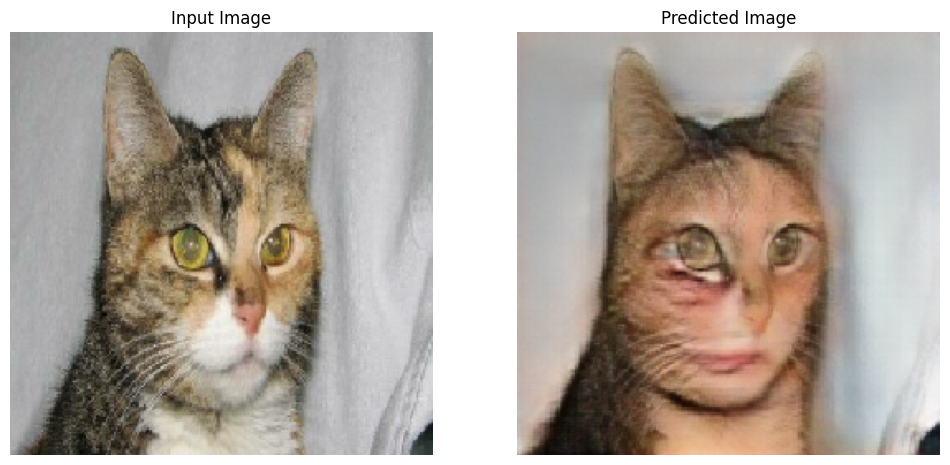

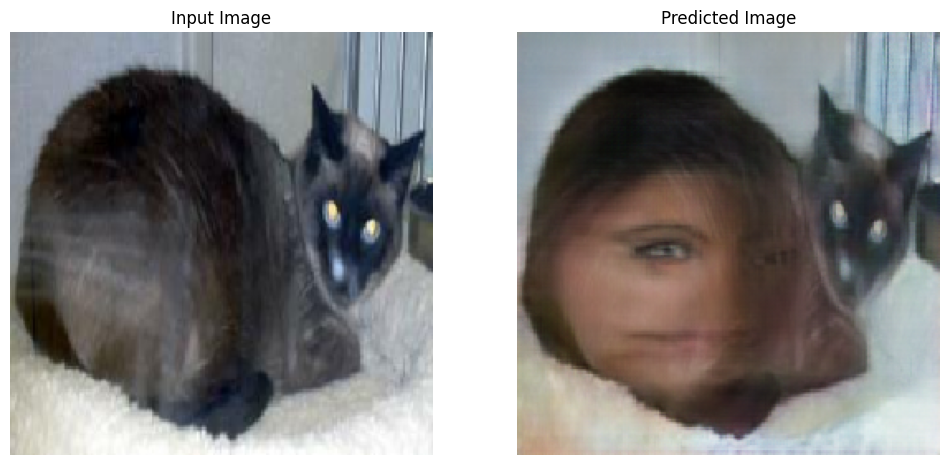

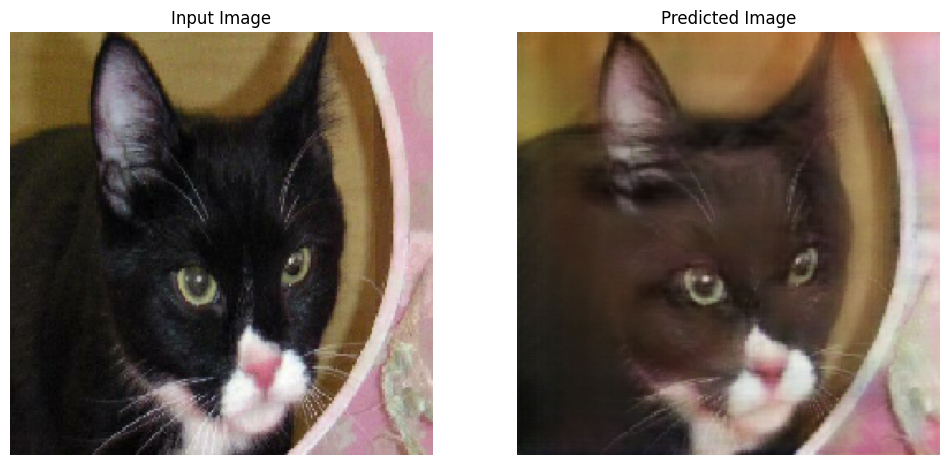

In [ ]:
for inp in test_animals.take(15):
    generate_images(generator_f, inp)